# *k*-NN Prediction for Hourly Demand Forecast

##### by Winston Chiong

The contents of this Jupyter Notebook are based off the paper:

***Fast Prediction for Sparse Time Series: Demand Forecast of EV Charging Stations for Cell Phone Applications***

*by Mostafa Majidpour, Student Member, IEEE, Charlie Qiu, Peter Chu, Rajit Gadh, Member, IEEE, and Hemanshu R. Pota, Member, IEEE.*

Link to paper [here](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=6966759).

The objective is to predict the future (24-hour forecasting horizon) energy consumption based on past energy consumption. 

$\large \hat{E}(t) = f(E(t-i), \epsilon(t)), \hspace{1cm} i \in \{1,2,\dots\}$,

where $\hat{E}(t)$ is the actual energy consumption at time $t$, $\hat{E}(t)$ is the prediction of energy consumption at time $t$, and $\epsilon(t)$ are variables other than past energy consumption, such as noise, that future energy consumption might depend on.

In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import time
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline

Let's begin by loading our hourly demand dataframe.

In [42]:
hourly_energy_demand_df = pd.read_csv("data/hourlydemand.csv")
hourly_energy_demand_df.set_index("time", inplace=True) 
hourly_energy_demand_df.index = pd.to_datetime(hourly_energy_demand_df.index)
hourly_energy_demand_df = hourly_energy_demand_df[["energy_demand_kWh", "day"]]
hourly_energy_demand_df

,energy_demand_kWh,day
time,,
2020-11-05 10:00:00,3.167500,Thursday
2020-11-05 11:00:00,0.527917,Thursday
2020-11-05 12:00:00,0.000000,Thursday
2020-11-05 13:00:00,0.000000,Thursday
2020-11-05 14:00:00,0.000000,Thursday
...,...,...
2023-01-07 15:00:00,0.000000,Saturday
2023-01-07 16:00:00,0.000000,Saturday
2023-01-07 17:00:00,3.379000,Saturday


## Visualization

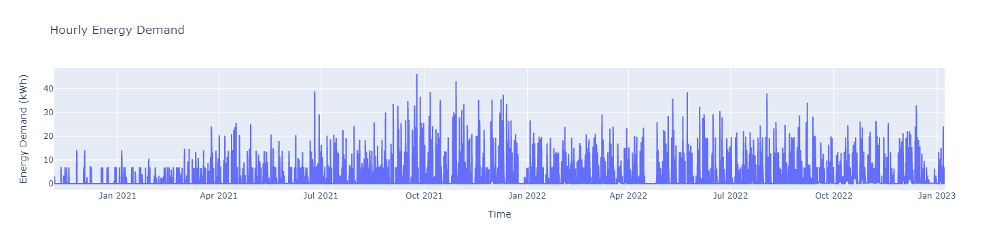

In [43]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = hourly_energy_demand_df.index  , y = hourly_energy_demand_df["energy_demand_kWh"], hovertext=hourly_energy_demand_df["day"]))
fig.update_layout(title = f"Hourly Energy Demand", xaxis_title = "Time", yaxis_title="Energy Demand (kWh)")
fig.show()

## Feature Engineering 

We can code up past hourly values as features; for example, a `lag1` column will have the previous day's power consumption at the same hour, a `lag2` column will have two days ago's power consumption at the same hour, etc.

`lag"N"` values will be the record from `N` days ago.

Depending on our depth of lags, some columns will have `NaN` as a value, as previous records don't exist. Let's drop those records. 

In [44]:
def create_lag_features(df, num_lag_depths, num_pts_per_day):
    """Function takes in a dataframe with a 'energy_demand_kWh' column at a below daily granularity, and returns a 
    new dataframe with lagged values; a "lag1" column will have the previous day's power demand at the same time, 
    a "lag2" column will have two days ago's power demand at the same time, etc. Function will drop rows with 
    any 'NaN' vlaues. 
    Parameters:
    ----
    df : Dataframe to append features.
    
    num_lag_depths : Number of lagged features to create.
    
    num_pts_per_day : Number of data points per day. For example, an dataframe with one data point per hour will have one a parameter value of 24. 
    """
    
    energy_demand_with_lags_df = df.copy(deep=True)
    for lag_depth in np.arange(1,num_lag_depths+1):
        column = energy_demand_with_lags_df["energy_demand_kWh"].shift(num_pts_per_day*lag_depth)
        energy_demand_with_lags_df = pd.concat([energy_demand_with_lags_df, column.rename("lag" + f"{lag_depth}")], axis=1)
    return energy_demand_with_lags_df.dropna()


## Applied Algorithms

Here, our output is the prediction energy consumption for the next 24 hours. 


$\large y(t) = E(t)$

The input is the concatenation of the consumption history for $D$ previous days.

$\large x(t) = \{E(t-24),E(t-48),\dots,E(t-24D)\}$

### Historical Average

This algorithm is extremely simple used only a baseline to compare model accuracy. With the historical average approach the power consumption at time $t$, $\hat{E}(t)$ is predicted using the average of the past $D$ energy consumption records occuring at the same time. Formally, 

$\large \hat{E}(t) = \frac{1}{D} \sum\limits_{d = 1}^{D} E(t - 24d)$

Here, $D$ is the depth of averaging, which is a parameter to be tuned.

For example, using $D = 8$, to estimate the energy consumption tomorrow at 9 AM, we would take the average of the past 8 days' energy consumption at 9 PM.

In [45]:
def historical_average(df, averaging_depth):
    """This function takes in a dataframe, and depth of averaging, and returns new dataframe containing a datetime index
    and predicted energy demand, based on the historical average algorithm. Dataframe must have a datetime index, 
    a "energy_demand_kWh" column, and "lagN" columns, where a "lagN" column is the record from N days ago, at the same time."""
    # copy dataframe
    df_predictions = df.copy(deep = True)
    
    # select only lag columns up to averaging depth
    df_predictions = df_predictions[["lag" + f"{lag_depth}" for lag_depth in np.arange(1, averaging_depth+1)]]
    
    # average across each row 
    df_predictions["prediction_average_algo"] = df_predictions.mean(axis = 1) 

    # return datetime index and associated predictions
    return df_predictions[["prediction_average_algo"]]


#### Historical Average Cross Validation

For the historical average algorithm, we can simply iterate through different values of $D$ (the depth of averaging) on a training set, find the value of $D$ with the lowest RMSE, and report the RMSE on the test set using the optimal $D$ value.

Let's withhold the last 20% of our data as our test set.

In [46]:
train, test = train_test_split(hourly_energy_demand_df, test_size=0.2, shuffle=False)

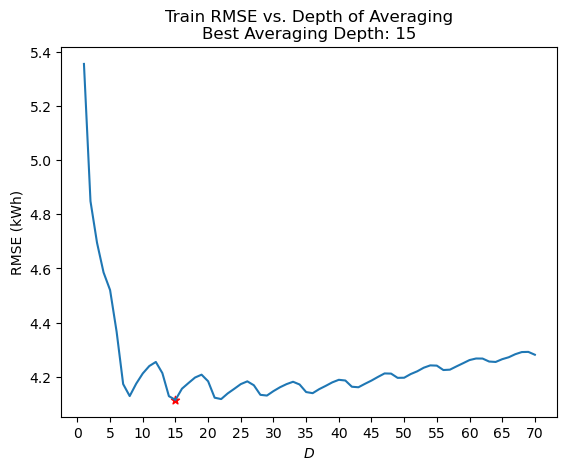

In [47]:
depth_array = []
rmse_array = []
max_depth = 70
best_params = {"depth":None, "rmse":np.inf}

for depth in np.arange(1, max_depth+1, 1):
    
    # create dataframe
    historical_average_df = create_lag_features(train, depth, 24)
    
    # predict values using historical average
    predictions_avg_algo_df = historical_average(historical_average_df, depth)
    
    # calculate RMSE
    train_rmse = mean_squared_error(
        y_true=train["energy_demand_kWh"].loc[train.index >= predictions_avg_algo_df.index[0]],
        y_pred=predictions_avg_algo_df["prediction_average_algo"], 
        squared=False
    )
    
    depth_array.append(depth)
    rmse_array.append(train_rmse)
    
    if train_rmse < best_params["rmse"]:
        best_params["depth"] = depth
        best_params["rmse"] = train_rmse
        
# visuals
sns.lineplot(x=depth_array, y=rmse_array, markevery=[0,1,2,3,4,5])
plt.scatter(x=best_params["depth"], y=best_params["rmse"], marker="*", color="red")
plt.title(f"Train RMSE vs. Depth of Averaging\nBest Averaging Depth: {best_params['depth']}")
plt.xlabel("$D$")
plt.ylabel("RMSE (kWh)")
plt.xticks(np.arange(0, max_depth+1, 5))
plt.show()

#### Visualization

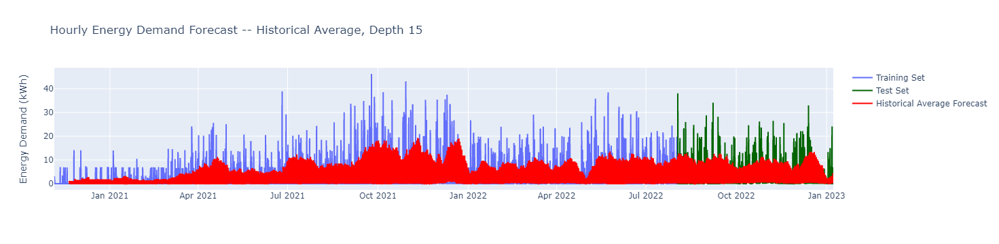

Test Set RMSE: 4.425142354525755 kWh


In [48]:
best_depth = best_params["depth"]

# create dataframe
historical_average_df = create_lag_features(hourly_energy_demand_df, best_depth, 24)

# predict values using historical average
predictions_avg_algo_df = historical_average(historical_average_df, best_depth)

# calculate test RMSE
historical_avg_test_rmse = mean_squared_error(
    y_true=test["energy_demand_kWh"], 
    y_pred=predictions_avg_algo_df["prediction_average_algo"].loc[predictions_avg_algo_df.index >= test.index[0]], 
    squared=False
)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x=train["energy_demand_kWh"].index, y=train["energy_demand_kWh"], name="Training Set",
               hovertext=train["day"])
)
fig.add_trace(
    go.Scatter(x=test["energy_demand_kWh"].index, y=test["energy_demand_kWh"], name="Test Set", line={"color":"darkgreen"},
               hovertext=test["day"])
)
fig.add_trace(
    go.Scatter(x=predictions_avg_algo_df.index, y=predictions_avg_algo_df["prediction_average_algo"], name="Historical Average Forecast", line={"color":"red"},
              hovertext=hourly_energy_demand_df["day"])
)

fig.update_layout({"title" : f"Hourly Energy Demand Forecast -- Historical Average, Depth {best_depth}" , "yaxis_title" : "Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {historical_avg_test_rmse} kWh")

### k-Nearest Neighbors

*k*-Nearest Neighbors is a supervised machine learning algorithm used for classification and regression. The algorithm calculates the *k* closest training example in a data set. The output is either class membership or the average of all *k* nearest neighbors. Note that different similarity metrics are used, with the most common being Euclidean distance.

Below is a high level summary of the *k*-NN algorithm.

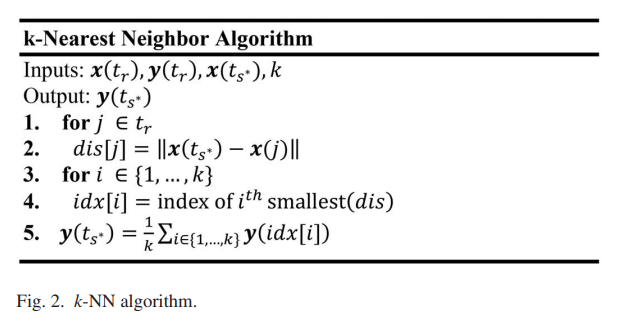


In plain English:

1. For every data point in your training set,
2. Store the distance between the test point and every point in the training set.
3. For the integers 1 to *k*,
4. Store the *k*th nearest datapoint from the training set to the test point.
5. Compute the average of the *k* training set records closest to the test point. Use this value for your prediction. 

The most common distance metric is Euclidean distance, which in 2-D space is the shortest path between two points. Here Euclidean distance is generalized for N-D space:

$$\sqrt{{(x1-y1)}^2 + {(x2-y2)}^2 + \dots + {(xN-yN)}^2}$$

#### Hyperparameters + Train / Validation / Test Split

Let's split our data in a way that doesn't violate the temporality of our data. Specifically we shouldn't have test data whose time index comes *before* our training data's time index. 

Here, we exhaustively search for the best depth (controls the number of features) and best number of neighbors of our kNN algorithm. For each combination of parameters, the data is fit to a training set (about the first 64% of the total data) and its error is calculated on the validation set (16% of data after the first 64%). After searching through all the parameters, the optimal parameters (as decided by the validation set error) are used to fit a model and the error on the test set (the last 20% of the data) is returned. 

Due to the high number of models to be fit, cross validation takes a couple minutes to run.

In [49]:
class SubsetLags(BaseEstimator, TransformerMixin):
    
    def __init__(self, num_lags=1):
        super().__init__()
        self.num_lags = num_lags
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return self.__select_subset_lags(X, self.num_lags)
        
    def __select_subset_lags(self, X, num_features):
        """Function takes in a dataframe with a 'energy_demand_kWh' column at select granularity with "lag1", "lag2",..., "lagN" features. 
        Function will select the first "num_features" of lags."""
        return X[[f"lag{depth}" for depth in np.arange(1, num_features+1)]]


In [34]:
max_depth = 60
max_neighbors = 20
best_params = {"best_depth":None, "best_rmse":np.inf, "best_n_neighbors":None}

# create df with features 
kNN_df = create_lag_features(hourly_energy_demand_df, max_depth, 24)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(
    kNN_df.drop(
        columns=[
            "energy_demand_kWh", "day", 
        ]
    ), 
    kNN_df[["energy_demand_kWh"]],
    test_size = 0.2, 
    shuffle=False
)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation, 
    y_train_validation,
    test_size = 0.2, 
    shuffle=False
)


In [35]:
pipeline = Pipeline(
    [
    ("subset_features", SubsetLags()),
    ("estimator", KNeighborsRegressor())
    ]
)

params = {"estimator__n_neighbors":np.arange(1,max_neighbors+1), "subset_features__num_lags":np.arange(1,max_depth+1)}

grid = GridSearchCV(estimator=pipeline, 
                    param_grid=params, 
                    scoring="neg_mean_squared_error", 
                    n_jobs=8, 
                    verbose=4,
                    cv=[(np.arange(0,len(X_train)), np.arange(len(X_train),len(X_train_validation)))]
                   )

start = time.time()
grid.fit(X_train_validation, y_train_validation)
end = time.time()
print(f"Total Fit Time: {end-start} s")

Fitting 1 folds for each of 1200 candidates, totalling 1200 fits
Total Fit Time: 180.4337193965912 s


#### Visualization

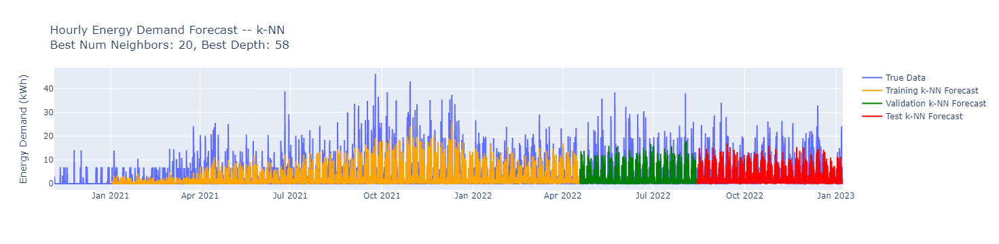

Test Set RMSE: 3.9613602333080737 kWh
Validation Set RMSE: 4.173574835253981 kWh


In [36]:
best_num_neighbors = grid.best_params_["estimator__n_neighbors"]
best_depth = grid.best_params_["subset_features__num_lags"]

kNN_df = create_lag_features(hourly_energy_demand_df, best_depth, 24)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(
    kNN_df.drop(
        columns=[
            "energy_demand_kWh", "day", 
        ]
    ), 
    kNN_df[["energy_demand_kWh"]],
    test_size = 0.2, 
    shuffle=False)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation,
    y_train_validation,
    test_size = 0.2, 
    shuffle=False
)

kNNRegressor = KNeighborsRegressor(n_neighbors=best_num_neighbors)
kNNRegressor.fit(X_train, y_train)

test_rmse = mean_squared_error(y_true=y_test, y_pred=kNNRegressor.predict(X_test), squared=False)
validation_rmse = mean_squared_error(y_true=y_validation, y_pred=kNNRegressor.predict(X_validation), squared=False)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x = hourly_energy_demand_df["energy_demand_kWh"].index , y = hourly_energy_demand_df["energy_demand_kWh"], name = "True Data", 
               hovertext=hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_train.index,
               y = kNNRegressor.predict(X_train).reshape(-1), 
               name = "Training k-NN Forecast" , line= {"color":"orange"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_validation.index,
               y = kNNRegressor.predict(X_validation).reshape(-1), 
               name = "Validation k-NN Forecast" , line= {"color":"green"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_test.index,
               y = kNNRegressor.predict(X_test).reshape(-1),
               name = "Test k-NN Forecast", line= {"color":"red"},
               hovertext = hourly_energy_demand_df["day"].loc[hourly_energy_demand_df["day"].index >= y_test.index[0]])
)

fig.update_layout({"title":f"Hourly Energy Demand Forecast -- k-NN<br>Best Num Neighbors: {best_num_neighbors}, Best Depth: {best_depth}", "yaxis_title":"Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {test_rmse} kWh")
print(f"Validation Set RMSE: {validation_rmse} kWh")

### Weighted *k*-Nearest Neighbors

Weighted *k*-Nearest Neighbors is a variant on the traditional *k*-Nearest Neighbors algorithm, with the main change that points closer to the query point should contribute more to the final prediction.

Instead of averaging the *k* closest training outputs, their weighted average is used, where the weights are a function of the similarity between input pairs.

The weights are defined based on Dudani's weights, which should arrive at better results, according to the literature. 

In the above figure, the following steps are replaced with step 5:

$\Large w_p = \frac{\mathrm{dis}[k+1] - \mathrm{dis}[p]}{\mathrm{dis}[k+1] - \mathrm{dis}[1]}, \hspace{1cm} p = 1,\dots,k$

where $\mathrm{dis}[p]$ is the distance of the $p$-th nearest neighbor to the query point, $\mathrm{dis}[1]$ is the distance of the nearest neighbor, and $\mathrm{dis}[k+1]$ is the distance of the $k+1$-th nearest neighbor. This is intentionally done, as the $k$-th nearest neighbor would have a weight of zero otherwise.

$\Large y(t_{s^*}) = \frac{1}{\sum_{q \in idx}w_q} \sum_{p \in idx}w_p y(p)$

The prediction output is then computed as weighted sum, divided by the sum of the weights.

#### Weight Function

In [181]:
def Dudani_weight_function(weights):
    """
    Takes in a 2-D array of distances, and returns an array of weights, with the same shape.
    """
    
    # helper function
    def calculate_1D(array):
        weights = np.array([])
        for distance in array:
            if distance == array[0]: # full weight, if distance is equal the closest neighbor
                weights = np.append(weights, 1)
            else:    
                curr_weight = (array[-1] - distance) / (array[-1] - array[0])
                weights = np.append(weights, curr_weight)
        return weights 
    
    return np.apply_along_axis(calculate_1D, axis=1, arr=weights)

#### Hyperparameters + Train / Validation / Test Split

In [182]:
max_depth = 60
max_neighbors = 20
best_params = {"best_depth":None, "best_rmse":np.inf, "best_n_neighbors":None}

# create df with features 
kNN_df = create_lag_features(hourly_energy_demand_df, max_depth, 24)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(
    kNN_df.drop(
        columns=[
            "energy_demand_kWh", "day", 
        ]
    ), 
    kNN_df[["energy_demand_kWh"]],
    test_size = 0.2, 
    shuffle=False
)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation, 
    y_train_validation,
    test_size = 0.2, 
    shuffle=False
)


In [183]:
pipeline = Pipeline(
    [
    ("subset_features", SubsetLags()),
    ("estimator", KNeighborsRegressor(weights=Dudani_weight_function))
    ]
)

params = {"estimator__n_neighbors":np.arange(1,max_neighbors+1), "subset_features__num_lags":np.arange(1,max_depth+1)}

grid = GridSearchCV(estimator=pipeline, 
                    param_grid=params, 
                    scoring="neg_mean_squared_error", 
                    n_jobs=8, 
                    verbose=4,
                    cv=[(np.arange(0,len(X_train)), np.arange(len(X_train),len(X_train_validation)))]
                   )
start = time.time()
grid.fit(X_train_validation, y_train_validation)
end = time.time()
print(f"Total Fit Time: {end-start} s")

Fitting 1 folds for each of 1200 candidates, totalling 1200 fits
Total Fit Time: 191.34663724899292 s


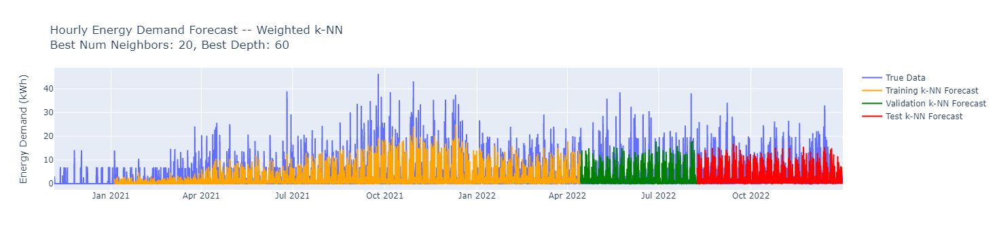

Test Set RMSE: 4.009053742152364 kWh
Validation Set RMSE: 4.271962016360563 kWh


In [184]:
best_num_neighbors = grid.best_params_["estimator__n_neighbors"]
best_depth = grid.best_params_["subset_features__num_lags"]

kNN_df = create_lag_features(hourly_energy_demand_df, best_depth, 24)

# split into train+validation and test
X_train_validation, X_test, y_train_validation, y_test = train_test_split(
    kNN_df.drop(
        columns=[
            "energy_demand_kWh", "day", 
        ]
    ), 
    kNN_df[["energy_demand_kWh"]],
    test_size = 0.2, 
    shuffle=False)

# split into train and validation
X_train, X_validation, y_train, y_validation = train_test_split(
    X_train_validation,
    y_train_validation,
    test_size = 0.2, 
    shuffle=False
)

kNNRegressor = KNeighborsRegressor(n_neighbors=best_num_neighbors)
kNNRegressor.fit(X_train, y_train)

test_rmse = mean_squared_error(y_true=y_test, y_pred=kNNRegressor.predict(X_test), squared=False)
validation_rmse = mean_squared_error(y_true=y_validation, y_pred=kNNRegressor.predict(X_validation), squared=False)

# visuals
fig = go.Figure()
fig.add_trace(
    go.Scatter(x = hourly_energy_demand_df["energy_demand_kWh"].index , y = hourly_energy_demand_df["energy_demand_kWh"], name = "True Data", 
               hovertext=hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_train.index,
               y = kNNRegressor.predict(X_train).reshape(-1), 
               name = "Training k-NN Forecast" , line= {"color":"orange"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_validation.index,
               y = kNNRegressor.predict(X_validation).reshape(-1), 
               name = "Validation k-NN Forecast" , line= {"color":"green"},
               hovertext = hourly_energy_demand_df["day"])
)
fig.add_trace(
    go.Scatter(x = y_test.index,
               y = kNNRegressor.predict(X_test).reshape(-1),
               name = "Test k-NN Forecast", line= {"color":"red"},
               hovertext = hourly_energy_demand_df["day"].loc[hourly_energy_demand_df["day"].index >= y_test.index[0]])
)

fig.update_layout({"title":f"Hourly Energy Demand Forecast -- Weighted k-NN<br>Best Num Neighbors: {best_num_neighbors}, Best Depth: {best_depth}", "yaxis_title":"Energy Demand (kWh)"})
fig.show()
print(f"Test Set RMSE: {test_rmse} kWh")
print(f"Validation Set RMSE: {validation_rmse} kWh")

# Future

## *k*-NN for 5-Min Granularity 

Currently, k-NN is too computationally complex to fit to our very large dataframe. 

- Currently, we are only using a chronological subset of features. What if we selected features non-chronologically? For example, we can use lag 1,2,3 and but lags 1,3. 
Perhaps PCA or another dimensionality reduction method, such as linear discriminant analysis will work good?
- Could we try a random forest method on highly dimensional (many lags) data?